Code for **super-resolution** (figures $1$ and $5$ from main paper).. Change `factor` to $8$ to reproduce images from fig. $9$ from supmat.

You can play with parameters and see how they affect the result. 

In [2]:
"""
*Uncomment if running on colab* 
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab 
"""
!git clone https://github.com/DmitryUlyanov/deep-image-prior
!mv deep-image-prior/* ./

Cloning into 'deep-image-prior'...
remote: Enumerating objects: 289, done.
remote: Total 289 (delta 0), reused 0 (delta 0), pack-reused 289
Receiving objects: 100% (289/289), 24.28 MiB | 7.86 MiB/s, done.
Resolving deltas: 100% (155/155), done.


# Import libs

In [0]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import argparse
import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import numpy as np
from models import *

import torch
import torch.optim

from skimage.measure import compare_psnr
from models.downsampler import Downsampler

from utils.sr_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize = -1 
factor = 4 # 8
enforse_div32 = 'CROP' # we usually need the dimensions to be divisible by a power of two (32 in this case)
PLOT = True

# To produce images from the paper we took *_GT.png images from LapSRN viewer for corresponding factor,
# e.g. x4/zebra_GT.png for factor=4, and x8/zebra_GT.png for factor=8 
path_to_image = 'data/sr/zebra_GT.png'

# Load image and baselines

HR and LR resolutions: (576, 384), (144, 96)


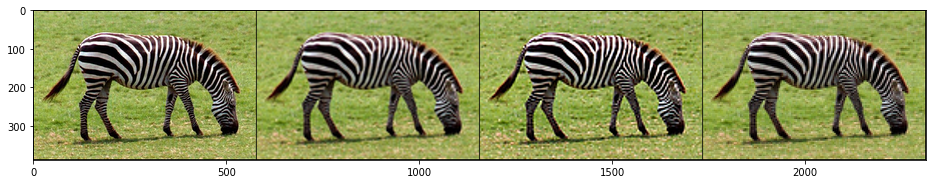

PSNR bicubic: 23.1048   PSNR nearest: 20.8212


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  if __name__ == '__main__':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  # Remove the CWD from sys.path while we load stuff.


In [4]:
# Starts here
imgs = load_LR_HR_imgs_sr(path_to_image , imsize, factor, enforse_div32)

imgs['bicubic_np'], imgs['sharp_np'], imgs['nearest_np'] = get_baselines(imgs['LR_pil'], imgs['HR_pil'])

if PLOT:
    plot_image_grid([imgs['HR_np'], imgs['bicubic_np'], imgs['sharp_np'], imgs['nearest_np']], 4,12);
    print ('PSNR bicubic: %.4f   PSNR nearest: %.4f' %  (
                                        compare_psnr(imgs['HR_np'], imgs['bicubic_np']), 
                                        compare_psnr(imgs['HR_np'], imgs['nearest_np'])))

# Set up parameters and net

In [0]:
input_depth = 32
 
INPUT =     'noise'
pad   =     'reflection'
OPT_OVER =  'net'
KERNEL_TYPE='lanczos2'

LR = 0.01
tv_weight = 0.0

OPTIMIZER = 'adam'

if factor == 4: 
    num_iter = 2000
    reg_noise_std = 0.03
elif factor == 8:
    num_iter = 4000
    reg_noise_std = 0.05
else:
    assert False, 'We did not experiment with other factors'

In [0]:
net_input = get_noise(input_depth, INPUT, (imgs['HR_pil'].size[1], imgs['HR_pil'].size[0])).type(dtype).detach()

NET_TYPE = 'skip' # UNet, ResNet
net = get_net(input_depth, 'skip', pad,
              skip_n33d=128, 
              skip_n33u=128, 
              skip_n11=4, 
              num_scales=5,
              upsample_mode='bilinear').type(dtype)

# Losses
mse = torch.nn.MSELoss().type(dtype)

img_LR_var = np_to_torch(imgs['LR_np']).type(dtype)

downsampler = Downsampler(n_planes=3, factor=factor, kernel_type=KERNEL_TYPE, phase=0.5, preserve_size=True).type(dtype)

# Define closure and optimize

In [0]:
def closure():
    global i, net_input
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out_HR = net(net_input)
    out_LR = downsampler(out_HR)

    total_loss = mse(out_LR, img_LR_var) 
    
    if tv_weight > 0:
        total_loss += tv_weight * tv_loss(out_HR)
        
    total_loss.backward()

    # Log
    psnr_LR = compare_psnr(imgs['LR_np'], torch_to_np(out_LR))
    psnr_HR = compare_psnr(imgs['HR_np'], torch_to_np(out_HR))
    print ('Iteration %05d    PSNR_LR %.3f   PSNR_HR %.3f' % (i, psnr_LR, psnr_HR), sep='\r', end='')
                      
    # History
    psnr_history.append([psnr_LR, psnr_HR])
    
    if PLOT and i % 100 == 0:
        out_HR_np = torch_to_np(out_HR)
        plot_image_grid([imgs['HR_np'], imgs['bicubic_np'], np.clip(out_HR_np, 0, 1)], factor=13, nrow=3)

    i += 1
    
    return total_loss

Starting optimization with ADAM


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2973: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.


Iteration 00000    PSNR_LR 12.537   PSNR_HR 12.050

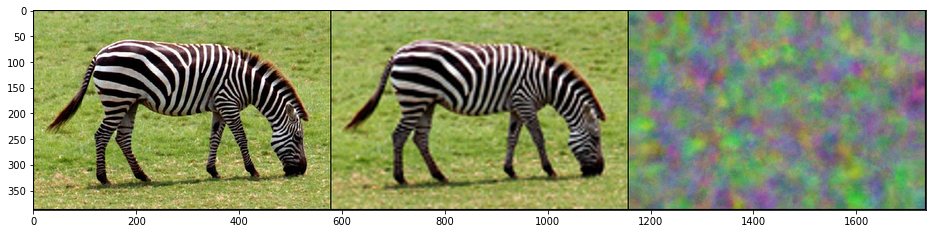

Iteration 00001    PSNR_LR 11.346   PSNR_HR 10.988Iteration 00002    PSNR_LR 11.441   PSNR_HR 11.088Iteration 00003    PSNR_LR 12.275   PSNR_HR 11.852Iteration 00004    PSNR_LR 13.913   PSNR_HR 13.333Iteration 00005    PSNR_LR 14.010   PSNR_HR 13.418Iteration 00006    PSNR_LR 14.356   PSNR_HR 13.723Iteration 00007    PSNR_LR 14.558   PSNR_HR 13.899Iteration 00008    PSNR_LR 14.613   PSNR_HR 13.952Iteration 00009    PSNR_LR 14.909   PSNR_HR 14.208Iteration 00010    PSNR_LR 15.042   PSNR_HR 14.317Iteration 00011    PSNR_LR 15.128   PSNR_HR 14.389Iteration 00012    PSNR_LR 15.119   PSNR_HR 14.377Iteration 00013    PSNR_LR 15.338   PSNR_HR 14.561Iteration 00014    PSNR_LR 15.244   PSNR_HR 14.476Iteration 00015    PSNR_LR 15.344   PSNR_HR 14.559Iteration 00016    PSNR_LR 15.338   PSNR_HR 14.554Iteration 00017    PSNR_LR 15.378   PSNR_HR 14.588Iteration 00018    PSNR_LR 15.373   PSNR_HR 14.586Iteration 00019    PSNR_LR 15.475   PSNR_HR 14.674Iteration 00020    PSNR_LR 15.535   PSNR_HR 14.724

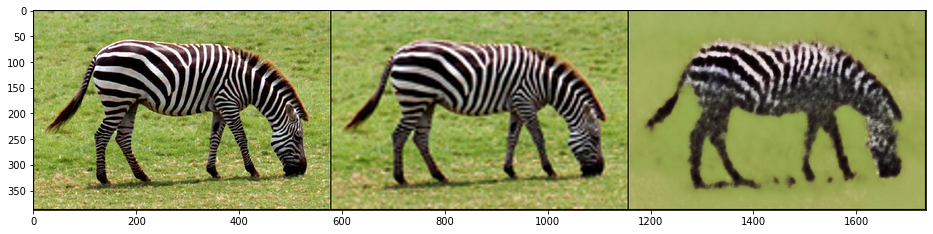

Iteration 00101    PSNR_LR 19.539   PSNR_HR 17.800Iteration 00102    PSNR_LR 19.540   PSNR_HR 17.807Iteration 00103    PSNR_LR 19.739   PSNR_HR 17.938Iteration 00104    PSNR_LR 19.734   PSNR_HR 17.946Iteration 00105    PSNR_LR 19.627   PSNR_HR 17.866Iteration 00106    PSNR_LR 19.800   PSNR_HR 18.001Iteration 00107    PSNR_LR 19.787   PSNR_HR 17.988Iteration 00108    PSNR_LR 19.853   PSNR_HR 18.035Iteration 00109    PSNR_LR 19.896   PSNR_HR 18.064Iteration 00110    PSNR_LR 20.092   PSNR_HR 18.182Iteration 00111    PSNR_LR 20.196   PSNR_HR 18.268Iteration 00112    PSNR_LR 20.133   PSNR_HR 18.215Iteration 00113    PSNR_LR 20.165   PSNR_HR 18.245Iteration 00114    PSNR_LR 20.218   PSNR_HR 18.267Iteration 00115    PSNR_LR 20.327   PSNR_HR 18.367Iteration 00116    PSNR_LR 20.448   PSNR_HR 18.438Iteration 00117    PSNR_LR 20.405   PSNR_HR 18.424Iteration 00118    PSNR_LR 20.534   PSNR_HR 18.513Iteration 00119    PSNR_LR 20.695   PSNR_HR 18.620Iteration 00120    PSNR_LR 20.678   PSNR_HR 18.610

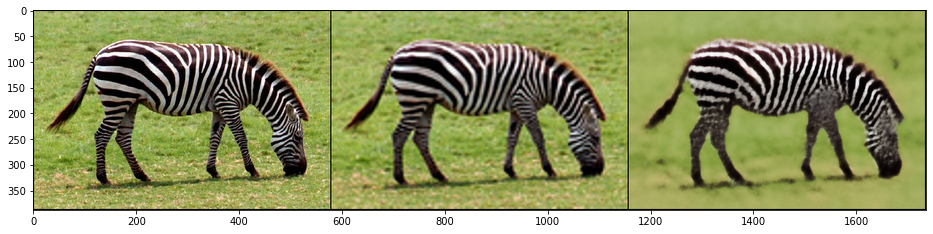

Iteration 00201    PSNR_LR 22.802   PSNR_HR 20.000Iteration 00202    PSNR_LR 22.808   PSNR_HR 19.992Iteration 00203    PSNR_LR 22.995   PSNR_HR 20.175Iteration 00204    PSNR_LR 22.868   PSNR_HR 20.126Iteration 00205    PSNR_LR 22.914   PSNR_HR 20.105Iteration 00206    PSNR_LR 22.990   PSNR_HR 20.134Iteration 00207    PSNR_LR 23.044   PSNR_HR 20.154Iteration 00208    PSNR_LR 22.987   PSNR_HR 20.166Iteration 00209    PSNR_LR 23.174   PSNR_HR 20.254Iteration 00210    PSNR_LR 23.022   PSNR_HR 20.142Iteration 00211    PSNR_LR 23.081   PSNR_HR 20.168Iteration 00212    PSNR_LR 23.005   PSNR_HR 20.113Iteration 00213    PSNR_LR 23.076   PSNR_HR 20.192Iteration 00214    PSNR_LR 23.163   PSNR_HR 20.270Iteration 00215    PSNR_LR 23.258   PSNR_HR 20.345Iteration 00216    PSNR_LR 23.242   PSNR_HR 20.306Iteration 00217    PSNR_LR 23.192   PSNR_HR 20.248Iteration 00218    PSNR_LR 23.254   PSNR_HR 20.307Iteration 00219    PSNR_LR 23.202   PSNR_HR 20.273Iteration 00220    PSNR_LR 23.321   PSNR_HR 20.329

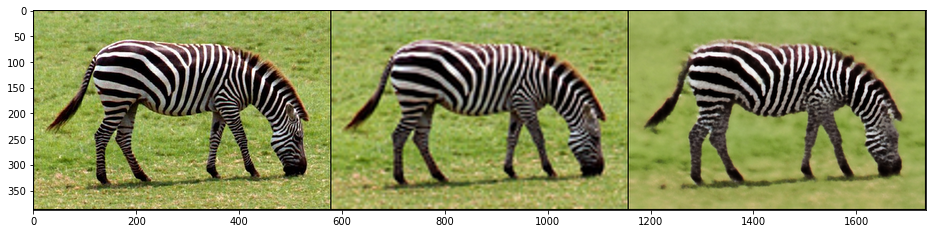

Iteration 00301    PSNR_LR 24.227   PSNR_HR 20.921Iteration 00302    PSNR_LR 24.559   PSNR_HR 21.098Iteration 00303    PSNR_LR 24.608   PSNR_HR 21.132Iteration 00304    PSNR_LR 24.247   PSNR_HR 20.958Iteration 00305    PSNR_LR 24.575   PSNR_HR 21.097Iteration 00306    PSNR_LR 24.488   PSNR_HR 20.989Iteration 00307    PSNR_LR 24.601   PSNR_HR 21.135Iteration 00308    PSNR_LR 24.612   PSNR_HR 21.084Iteration 00309    PSNR_LR 24.701   PSNR_HR 21.164Iteration 00310    PSNR_LR 24.568   PSNR_HR 21.049Iteration 00311    PSNR_LR 24.807   PSNR_HR 21.174Iteration 00312    PSNR_LR 24.670   PSNR_HR 21.118Iteration 00313    PSNR_LR 24.729   PSNR_HR 21.210Iteration 00314    PSNR_LR 24.648   PSNR_HR 21.139Iteration 00315    PSNR_LR 24.835   PSNR_HR 21.255Iteration 00316    PSNR_LR 24.839   PSNR_HR 21.253Iteration 00317    PSNR_LR 24.799   PSNR_HR 21.194Iteration 00318    PSNR_LR 24.657   PSNR_HR 21.032Iteration 00319    PSNR_LR 24.778   PSNR_HR 21.078Iteration 00320    PSNR_LR 24.806   PSNR_HR 21.211

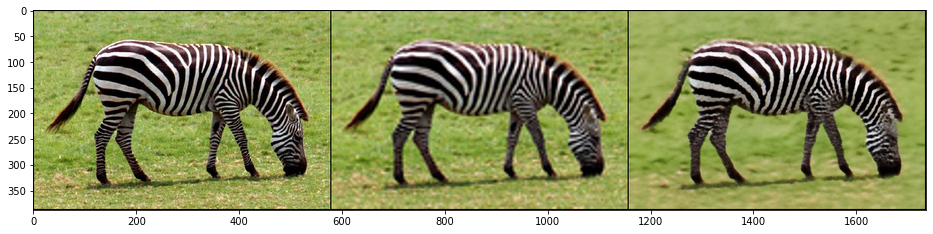

Iteration 00401    PSNR_LR 25.921   PSNR_HR 21.789Iteration 00402    PSNR_LR 25.923   PSNR_HR 21.796Iteration 00403    PSNR_LR 25.971   PSNR_HR 21.740Iteration 00404    PSNR_LR 25.917   PSNR_HR 21.738Iteration 00405    PSNR_LR 25.967   PSNR_HR 21.836Iteration 00406    PSNR_LR 26.157   PSNR_HR 21.869Iteration 00407    PSNR_LR 26.076   PSNR_HR 21.798Iteration 00408    PSNR_LR 26.071   PSNR_HR 21.847Iteration 00409    PSNR_LR 26.219   PSNR_HR 21.882Iteration 00410    PSNR_LR 26.090   PSNR_HR 21.818Iteration 00411    PSNR_LR 26.069   PSNR_HR 21.821Iteration 00412    PSNR_LR 26.235   PSNR_HR 21.877Iteration 00413    PSNR_LR 26.111   PSNR_HR 21.820Iteration 00414    PSNR_LR 26.251   PSNR_HR 21.841Iteration 00415    PSNR_LR 26.172   PSNR_HR 21.916Iteration 00416    PSNR_LR 26.263   PSNR_HR 21.915Iteration 00417    PSNR_LR 26.005   PSNR_HR 21.771Iteration 00418    PSNR_LR 26.059   PSNR_HR 21.871Iteration 00419    PSNR_LR 26.291   PSNR_HR 21.970Iteration 00420    PSNR_LR 26.184   PSNR_HR 21.888

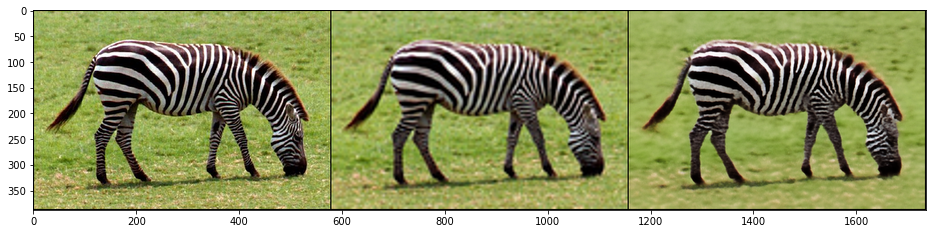

Iteration 00501    PSNR_LR 26.863   PSNR_HR 22.190Iteration 00502    PSNR_LR 27.058   PSNR_HR 22.353Iteration 00503    PSNR_LR 27.004   PSNR_HR 22.309Iteration 00504    PSNR_LR 27.007   PSNR_HR 22.280Iteration 00505    PSNR_LR 27.087   PSNR_HR 22.325Iteration 00506    PSNR_LR 27.111   PSNR_HR 22.336Iteration 00507    PSNR_LR 27.132   PSNR_HR 22.298Iteration 00508    PSNR_LR 27.094   PSNR_HR 22.323Iteration 00509    PSNR_LR 27.147   PSNR_HR 22.356Iteration 00510    PSNR_LR 27.156   PSNR_HR 22.345Iteration 00511    PSNR_LR 27.238   PSNR_HR 22.343Iteration 00512    PSNR_LR 27.245   PSNR_HR 22.418Iteration 00513    PSNR_LR 26.975   PSNR_HR 22.252Iteration 00514    PSNR_LR 27.205   PSNR_HR 22.364Iteration 00515    PSNR_LR 27.227   PSNR_HR 22.404Iteration 00516    PSNR_LR 27.066   PSNR_HR 22.329Iteration 00517    PSNR_LR 27.189   PSNR_HR 22.376Iteration 00518    PSNR_LR 27.341   PSNR_HR 22.398Iteration 00519    PSNR_LR 27.295   PSNR_HR 22.352Iteration 00520    PSNR_LR 27.228   PSNR_HR 22.378

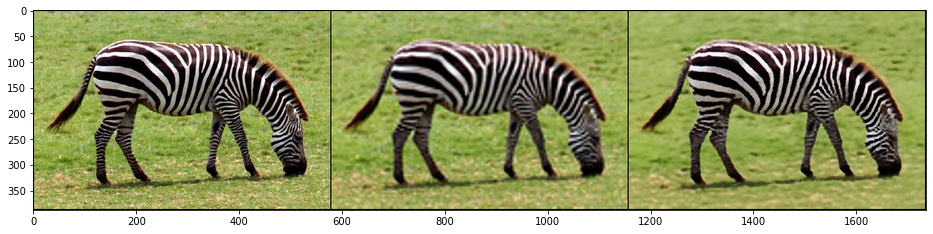

Iteration 00601    PSNR_LR 27.531   PSNR_HR 22.583Iteration 00602    PSNR_LR 27.867   PSNR_HR 22.583Iteration 00603    PSNR_LR 27.704   PSNR_HR 22.451Iteration 00604    PSNR_LR 27.685   PSNR_HR 22.566Iteration 00605    PSNR_LR 27.705   PSNR_HR 22.567Iteration 00606    PSNR_LR 27.808   PSNR_HR 22.588Iteration 00607    PSNR_LR 27.730   PSNR_HR 22.636Iteration 00608    PSNR_LR 27.916   PSNR_HR 22.671Iteration 00609    PSNR_LR 27.890   PSNR_HR 22.621Iteration 00610    PSNR_LR 27.720   PSNR_HR 22.567Iteration 00611    PSNR_LR 27.897   PSNR_HR 22.665Iteration 00612    PSNR_LR 27.915   PSNR_HR 22.652Iteration 00613    PSNR_LR 27.901   PSNR_HR 22.608Iteration 00614    PSNR_LR 27.888   PSNR_HR 22.704Iteration 00615    PSNR_LR 27.816   PSNR_HR 22.620Iteration 00616    PSNR_LR 27.925   PSNR_HR 22.663Iteration 00617    PSNR_LR 27.628   PSNR_HR 22.564Iteration 00618    PSNR_LR 28.051   PSNR_HR 22.670Iteration 00619    PSNR_LR 27.728   PSNR_HR 22.511Iteration 00620    PSNR_LR 27.790   PSNR_HR 22.648

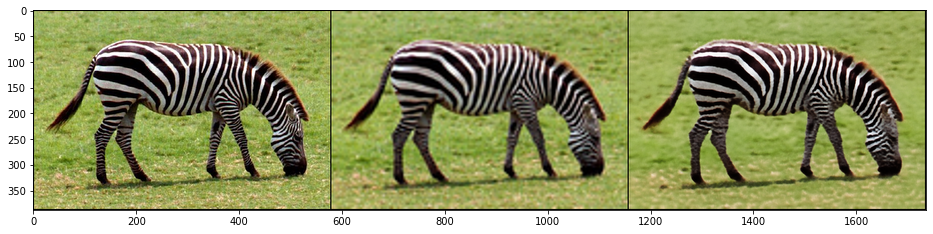

Iteration 00701    PSNR_LR 28.347   PSNR_HR 22.802Iteration 00702    PSNR_LR 28.432   PSNR_HR 22.835Iteration 00703    PSNR_LR 28.202   PSNR_HR 22.777Iteration 00704    PSNR_LR 28.448   PSNR_HR 22.869Iteration 00705    PSNR_LR 28.320   PSNR_HR 22.787Iteration 00706    PSNR_LR 28.426   PSNR_HR 22.873Iteration 00707    PSNR_LR 28.674   PSNR_HR 22.967Iteration 00708    PSNR_LR 28.443   PSNR_HR 22.889Iteration 00709    PSNR_LR 28.606   PSNR_HR 22.906Iteration 00710    PSNR_LR 28.638   PSNR_HR 22.877Iteration 00711    PSNR_LR 28.679   PSNR_HR 22.860Iteration 00712    PSNR_LR 28.651   PSNR_HR 22.858Iteration 00713    PSNR_LR 28.634   PSNR_HR 22.889Iteration 00714    PSNR_LR 28.625   PSNR_HR 22.876Iteration 00715    PSNR_LR 28.618   PSNR_HR 22.947Iteration 00716    PSNR_LR 28.638   PSNR_HR 22.904Iteration 00717    PSNR_LR 28.475   PSNR_HR 22.818Iteration 00718    PSNR_LR 28.379   PSNR_HR 22.857Iteration 00719    PSNR_LR 28.597   PSNR_HR 22.857Iteration 00720    PSNR_LR 28.684   PSNR_HR 22.946

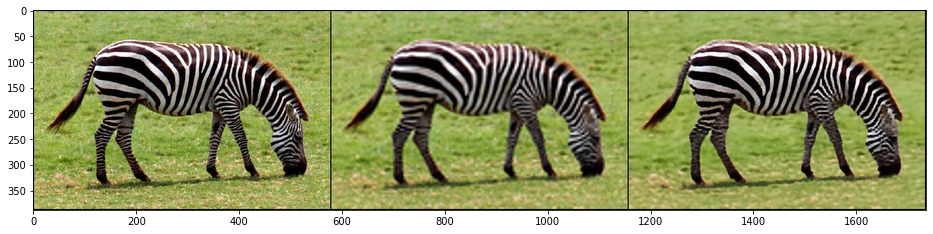

Iteration 00801    PSNR_LR 29.108   PSNR_HR 23.041Iteration 00802    PSNR_LR 29.107   PSNR_HR 22.981Iteration 00803    PSNR_LR 29.128   PSNR_HR 23.084Iteration 00804    PSNR_LR 29.135   PSNR_HR 23.091Iteration 00805    PSNR_LR 28.976   PSNR_HR 23.008Iteration 00806    PSNR_LR 29.140   PSNR_HR 23.083Iteration 00807    PSNR_LR 29.102   PSNR_HR 23.078Iteration 00808    PSNR_LR 29.164   PSNR_HR 23.071Iteration 00809    PSNR_LR 29.064   PSNR_HR 23.084Iteration 00810    PSNR_LR 29.134   PSNR_HR 23.014Iteration 00811    PSNR_LR 29.087   PSNR_HR 23.044Iteration 00812    PSNR_LR 29.075   PSNR_HR 23.106Iteration 00813    PSNR_LR 29.243   PSNR_HR 23.132Iteration 00814    PSNR_LR 29.381   PSNR_HR 23.167Iteration 00815    PSNR_LR 29.213   PSNR_HR 23.050Iteration 00816    PSNR_LR 29.190   PSNR_HR 23.105Iteration 00817    PSNR_LR 29.235   PSNR_HR 23.134Iteration 00818    PSNR_LR 29.143   PSNR_HR 23.008Iteration 00819    PSNR_LR 29.314   PSNR_HR 23.140Iteration 00820    PSNR_LR 29.293   PSNR_HR 23.154

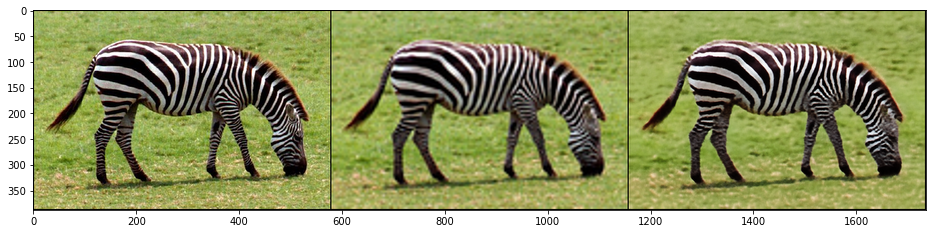

Iteration 00901    PSNR_LR 29.390   PSNR_HR 23.226Iteration 00902    PSNR_LR 29.500   PSNR_HR 23.208Iteration 00903    PSNR_LR 29.413   PSNR_HR 23.135Iteration 00904    PSNR_LR 29.579   PSNR_HR 23.241Iteration 00905    PSNR_LR 29.605   PSNR_HR 23.283Iteration 00906    PSNR_LR 29.525   PSNR_HR 23.218Iteration 00907    PSNR_LR 29.553   PSNR_HR 23.246Iteration 00908    PSNR_LR 29.432   PSNR_HR 23.219Iteration 00909    PSNR_LR 29.558   PSNR_HR 23.210Iteration 00910    PSNR_LR 29.560   PSNR_HR 23.256Iteration 00911    PSNR_LR 29.617   PSNR_HR 23.272Iteration 00912    PSNR_LR 29.650   PSNR_HR 23.278Iteration 00913    PSNR_LR 29.581   PSNR_HR 23.235Iteration 00914    PSNR_LR 29.641   PSNR_HR 23.293Iteration 00915    PSNR_LR 29.848   PSNR_HR 23.351Iteration 00916    PSNR_LR 29.686   PSNR_HR 23.241Iteration 00917    PSNR_LR 29.777   PSNR_HR 23.339Iteration 00918    PSNR_LR 29.791   PSNR_HR 23.280Iteration 00919    PSNR_LR 29.741   PSNR_HR 23.270Iteration 00920    PSNR_LR 29.644   PSNR_HR 23.269

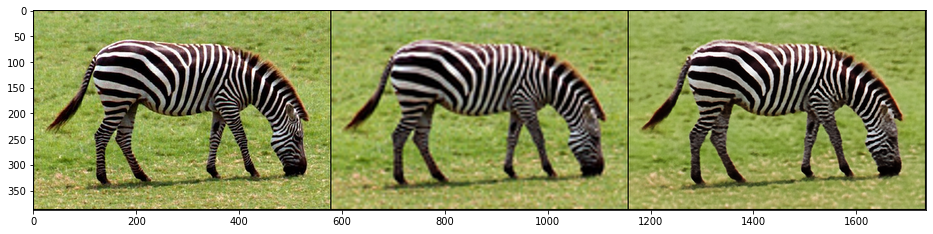

Iteration 01001    PSNR_LR 29.979   PSNR_HR 23.366Iteration 01002    PSNR_LR 29.986   PSNR_HR 23.379Iteration 01003    PSNR_LR 30.096   PSNR_HR 23.354Iteration 01004    PSNR_LR 30.111   PSNR_HR 23.327Iteration 01005    PSNR_LR 29.957   PSNR_HR 23.365Iteration 01006    PSNR_LR 29.917   PSNR_HR 23.315Iteration 01007    PSNR_LR 30.017   PSNR_HR 23.343Iteration 01008    PSNR_LR 30.178   PSNR_HR 23.457Iteration 01009    PSNR_LR 29.879   PSNR_HR 23.361Iteration 01010    PSNR_LR 30.032   PSNR_HR 23.378Iteration 01011    PSNR_LR 30.112   PSNR_HR 23.371Iteration 01012    PSNR_LR 29.949   PSNR_HR 23.390Iteration 01013    PSNR_LR 29.995   PSNR_HR 23.363Iteration 01014    PSNR_LR 30.160   PSNR_HR 23.349Iteration 01015    PSNR_LR 30.047   PSNR_HR 23.315Iteration 01016    PSNR_LR 30.027   PSNR_HR 23.307Iteration 01017    PSNR_LR 30.165   PSNR_HR 23.371Iteration 01018    PSNR_LR 30.175   PSNR_HR 23.410Iteration 01019    PSNR_LR 30.166   PSNR_HR 23.417Iteration 01020    PSNR_LR 30.032   PSNR_HR 23.383

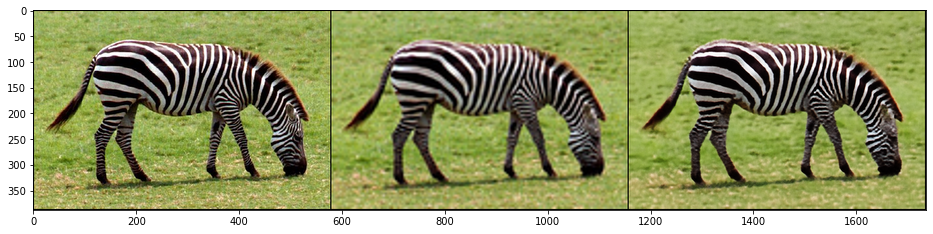

Iteration 01101    PSNR_LR 30.577   PSNR_HR 23.551Iteration 01102    PSNR_LR 30.642   PSNR_HR 23.529Iteration 01103    PSNR_LR 30.426   PSNR_HR 23.448Iteration 01104    PSNR_LR 30.445   PSNR_HR 23.431Iteration 01105    PSNR_LR 30.318   PSNR_HR 23.352Iteration 01106    PSNR_LR 30.444   PSNR_HR 23.468Iteration 01107    PSNR_LR 30.393   PSNR_HR 23.433Iteration 01108    PSNR_LR 30.672   PSNR_HR 23.491Iteration 01109    PSNR_LR 30.360   PSNR_HR 23.426Iteration 01110    PSNR_LR 30.360   PSNR_HR 23.407Iteration 01111    PSNR_LR 30.360   PSNR_HR 23.506Iteration 01112    PSNR_LR 30.504   PSNR_HR 23.438Iteration 01113    PSNR_LR 30.458   PSNR_HR 23.401Iteration 01114    PSNR_LR 30.351   PSNR_HR 23.496Iteration 01115    PSNR_LR 30.563   PSNR_HR 23.479Iteration 01116    PSNR_LR 30.424   PSNR_HR 23.426Iteration 01117    PSNR_LR 30.133   PSNR_HR 23.437Iteration 01118    PSNR_LR 30.401   PSNR_HR 23.425Iteration 01119    PSNR_LR 30.419   PSNR_HR 23.402Iteration 01120    PSNR_LR 30.614   PSNR_HR 23.452

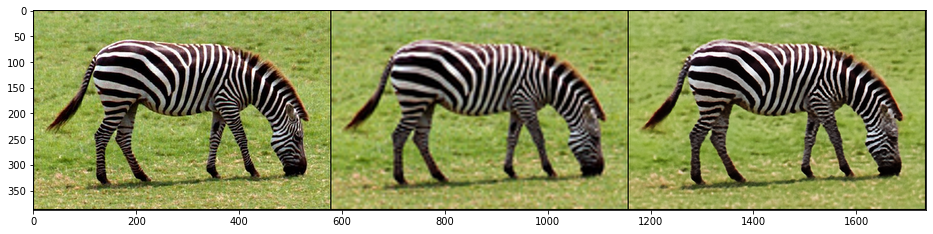

Iteration 01201    PSNR_LR 30.764   PSNR_HR 23.560Iteration 01202    PSNR_LR 30.878   PSNR_HR 23.572Iteration 01203    PSNR_LR 30.787   PSNR_HR 23.562Iteration 01204    PSNR_LR 30.721   PSNR_HR 23.501Iteration 01205    PSNR_LR 30.584   PSNR_HR 23.510Iteration 01206    PSNR_LR 30.766   PSNR_HR 23.672Iteration 01207    PSNR_LR 30.821   PSNR_HR 23.597Iteration 01208    PSNR_LR 30.846   PSNR_HR 23.581Iteration 01209    PSNR_LR 30.832   PSNR_HR 23.560Iteration 01210    PSNR_LR 30.798   PSNR_HR 23.541Iteration 01211    PSNR_LR 31.030   PSNR_HR 23.591Iteration 01212    PSNR_LR 30.849   PSNR_HR 23.580Iteration 01213    PSNR_LR 31.036   PSNR_HR 23.578Iteration 01214    PSNR_LR 30.836   PSNR_HR 23.602Iteration 01215    PSNR_LR 30.757   PSNR_HR 23.586Iteration 01216    PSNR_LR 30.695   PSNR_HR 23.507Iteration 01217    PSNR_LR 30.767   PSNR_HR 23.581Iteration 01218    PSNR_LR 30.935   PSNR_HR 23.565Iteration 01219    PSNR_LR 30.967   PSNR_HR 23.584Iteration 01220    PSNR_LR 30.981   PSNR_HR 23.640

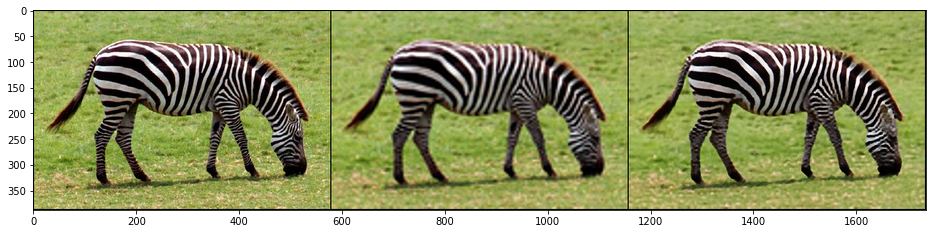

Iteration 01301    PSNR_LR 31.395   PSNR_HR 23.660Iteration 01302    PSNR_LR 31.169   PSNR_HR 23.613Iteration 01303    PSNR_LR 31.291   PSNR_HR 23.652Iteration 01304    PSNR_LR 31.391   PSNR_HR 23.645Iteration 01305    PSNR_LR 31.310   PSNR_HR 23.644Iteration 01306    PSNR_LR 31.212   PSNR_HR 23.697Iteration 01307    PSNR_LR 31.319   PSNR_HR 23.693Iteration 01308    PSNR_LR 31.257   PSNR_HR 23.696Iteration 01309    PSNR_LR 31.339   PSNR_HR 23.731Iteration 01310    PSNR_LR 31.264   PSNR_HR 23.612Iteration 01311    PSNR_LR 31.238   PSNR_HR 23.624Iteration 01312    PSNR_LR 31.265   PSNR_HR 23.629Iteration 01313    PSNR_LR 31.299   PSNR_HR 23.662Iteration 01314    PSNR_LR 31.312   PSNR_HR 23.716Iteration 01315    PSNR_LR 31.456   PSNR_HR 23.763Iteration 01316    PSNR_LR 31.373   PSNR_HR 23.657Iteration 01317    PSNR_LR 31.196   PSNR_HR 23.538Iteration 01318    PSNR_LR 31.251   PSNR_HR 23.657Iteration 01319    PSNR_LR 31.204   PSNR_HR 23.707Iteration 01320    PSNR_LR 31.260   PSNR_HR 23.625

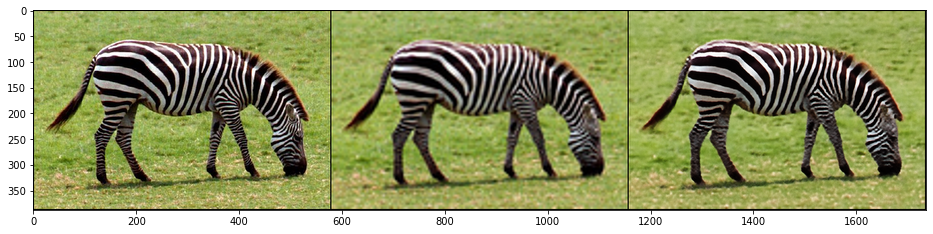

Iteration 01401    PSNR_LR 31.669   PSNR_HR 23.757Iteration 01402    PSNR_LR 31.687   PSNR_HR 23.765Iteration 01403    PSNR_LR 31.569   PSNR_HR 23.745Iteration 01404    PSNR_LR 31.620   PSNR_HR 23.723Iteration 01405    PSNR_LR 31.607   PSNR_HR 23.715Iteration 01406    PSNR_LR 31.573   PSNR_HR 23.666Iteration 01407    PSNR_LR 31.653   PSNR_HR 23.678Iteration 01408    PSNR_LR 31.528   PSNR_HR 23.741Iteration 01409    PSNR_LR 31.584   PSNR_HR 23.830Iteration 01410    PSNR_LR 31.730   PSNR_HR 23.755Iteration 01411    PSNR_LR 31.582   PSNR_HR 23.692Iteration 01412    PSNR_LR 31.686   PSNR_HR 23.698Iteration 01413    PSNR_LR 31.756   PSNR_HR 23.729Iteration 01414    PSNR_LR 31.560   PSNR_HR 23.702Iteration 01415    PSNR_LR 31.555   PSNR_HR 23.737Iteration 01416    PSNR_LR 31.598   PSNR_HR 23.784Iteration 01417    PSNR_LR 31.619   PSNR_HR 23.747Iteration 01418    PSNR_LR 31.829   PSNR_HR 23.769Iteration 01419    PSNR_LR 31.679   PSNR_HR 23.727Iteration 01420    PSNR_LR 31.589   PSNR_HR 23.703

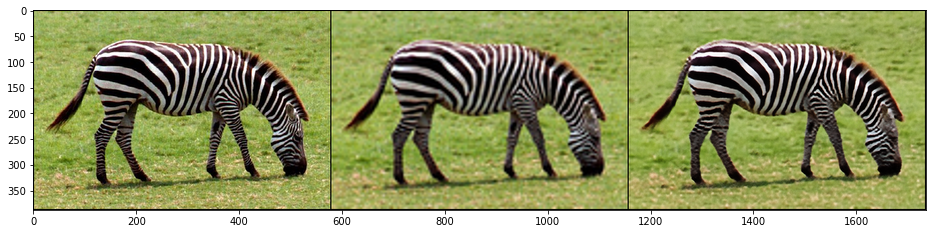

Iteration 01501    PSNR_LR 31.802   PSNR_HR 23.820Iteration 01502    PSNR_LR 31.929   PSNR_HR 23.845Iteration 01503    PSNR_LR 31.727   PSNR_HR 23.744Iteration 01504    PSNR_LR 31.948   PSNR_HR 23.802Iteration 01505    PSNR_LR 31.811   PSNR_HR 23.756Iteration 01506    PSNR_LR 31.854   PSNR_HR 23.799Iteration 01507    PSNR_LR 31.882   PSNR_HR 23.814Iteration 01508    PSNR_LR 32.028   PSNR_HR 23.856Iteration 01509    PSNR_LR 31.831   PSNR_HR 23.768Iteration 01510    PSNR_LR 31.878   PSNR_HR 23.779Iteration 01511    PSNR_LR 31.867   PSNR_HR 23.814Iteration 01512    PSNR_LR 31.977   PSNR_HR 23.838Iteration 01513    PSNR_LR 31.929   PSNR_HR 23.789Iteration 01514    PSNR_LR 31.956   PSNR_HR 23.829Iteration 01515    PSNR_LR 31.917   PSNR_HR 23.784Iteration 01516    PSNR_LR 32.094   PSNR_HR 23.821Iteration 01517    PSNR_LR 31.854   PSNR_HR 23.824Iteration 01518    PSNR_LR 31.916   PSNR_HR 23.882Iteration 01519    PSNR_LR 32.025   PSNR_HR 23.829Iteration 01520    PSNR_LR 31.861   PSNR_HR 23.788

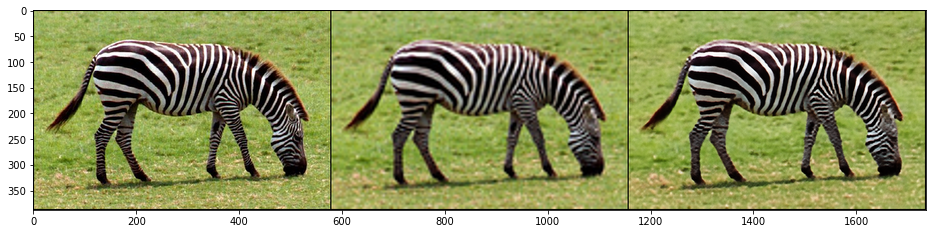

Iteration 01601    PSNR_LR 31.900   PSNR_HR 23.865Iteration 01602    PSNR_LR 32.327   PSNR_HR 23.875Iteration 01603    PSNR_LR 32.228   PSNR_HR 23.843Iteration 01604    PSNR_LR 32.265   PSNR_HR 23.857Iteration 01605    PSNR_LR 31.971   PSNR_HR 23.842Iteration 01606    PSNR_LR 32.203   PSNR_HR 23.904Iteration 01607    PSNR_LR 32.293   PSNR_HR 23.870Iteration 01608    PSNR_LR 32.234   PSNR_HR 23.847Iteration 01609    PSNR_LR 32.132   PSNR_HR 23.891Iteration 01610    PSNR_LR 32.290   PSNR_HR 23.874Iteration 01611    PSNR_LR 32.427   PSNR_HR 23.892Iteration 01612    PSNR_LR 32.037   PSNR_HR 23.821Iteration 01613    PSNR_LR 32.009   PSNR_HR 23.824Iteration 01614    PSNR_LR 32.182   PSNR_HR 23.931Iteration 01615    PSNR_LR 32.358   PSNR_HR 23.876Iteration 01616    PSNR_LR 32.241   PSNR_HR 23.807Iteration 01617    PSNR_LR 32.128   PSNR_HR 23.871Iteration 01618    PSNR_LR 32.071   PSNR_HR 23.867Iteration 01619    PSNR_LR 32.303   PSNR_HR 23.898Iteration 01620    PSNR_LR 32.319   PSNR_HR 23.881

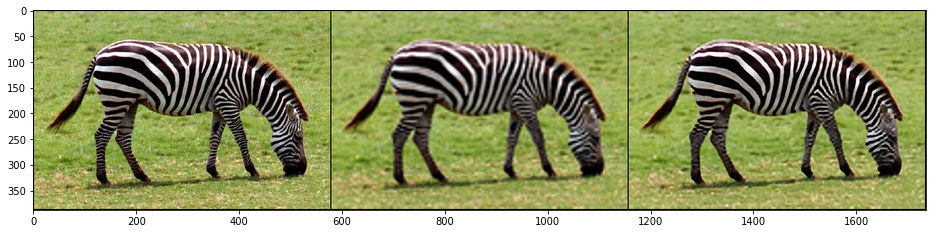

Iteration 01701    PSNR_LR 32.318   PSNR_HR 23.924Iteration 01702    PSNR_LR 32.467   PSNR_HR 23.915Iteration 01703    PSNR_LR 32.402   PSNR_HR 23.954Iteration 01704    PSNR_LR 32.287   PSNR_HR 23.881Iteration 01705    PSNR_LR 32.507   PSNR_HR 23.978Iteration 01706    PSNR_LR 32.439   PSNR_HR 23.967Iteration 01707    PSNR_LR 32.334   PSNR_HR 23.860Iteration 01708    PSNR_LR 32.613   PSNR_HR 23.957Iteration 01709    PSNR_LR 32.587   PSNR_HR 23.953Iteration 01710    PSNR_LR 32.562   PSNR_HR 23.952Iteration 01711    PSNR_LR 32.729   PSNR_HR 23.997Iteration 01712    PSNR_LR 32.545   PSNR_HR 23.919Iteration 01713    PSNR_LR 32.748   PSNR_HR 23.944Iteration 01714    PSNR_LR 32.569   PSNR_HR 23.944Iteration 01715    PSNR_LR 32.680   PSNR_HR 24.021Iteration 01716    PSNR_LR 32.495   PSNR_HR 23.968Iteration 01717    PSNR_LR 32.424   PSNR_HR 23.908Iteration 01718    PSNR_LR 32.762   PSNR_HR 23.966Iteration 01719    PSNR_LR 32.569   PSNR_HR 23.948Iteration 01720    PSNR_LR 32.645   PSNR_HR 23.985

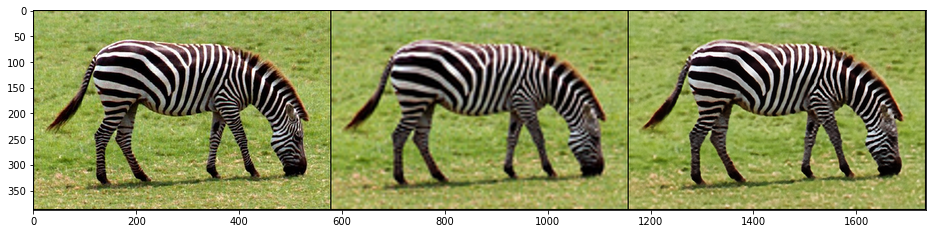

Iteration 01801    PSNR_LR 32.903   PSNR_HR 24.007Iteration 01802    PSNR_LR 32.828   PSNR_HR 23.997Iteration 01803    PSNR_LR 32.989   PSNR_HR 24.074Iteration 01804    PSNR_LR 32.939   PSNR_HR 24.005Iteration 01805    PSNR_LR 32.857   PSNR_HR 23.933Iteration 01806    PSNR_LR 33.014   PSNR_HR 24.024Iteration 01807    PSNR_LR 32.808   PSNR_HR 24.026Iteration 01808    PSNR_LR 32.907   PSNR_HR 24.006Iteration 01809    PSNR_LR 32.778   PSNR_HR 23.941Iteration 01810    PSNR_LR 32.842   PSNR_HR 23.961Iteration 01811    PSNR_LR 32.932   PSNR_HR 23.998Iteration 01812    PSNR_LR 32.760   PSNR_HR 24.033Iteration 01813    PSNR_LR 33.025   PSNR_HR 24.048Iteration 01814    PSNR_LR 32.836   PSNR_HR 24.009Iteration 01815    PSNR_LR 32.987   PSNR_HR 24.026Iteration 01816    PSNR_LR 32.888   PSNR_HR 24.048Iteration 01817    PSNR_LR 32.733   PSNR_HR 23.991Iteration 01818    PSNR_LR 32.989   PSNR_HR 23.981Iteration 01819    PSNR_LR 32.911   PSNR_HR 23.966Iteration 01820    PSNR_LR 32.756   PSNR_HR 23.981

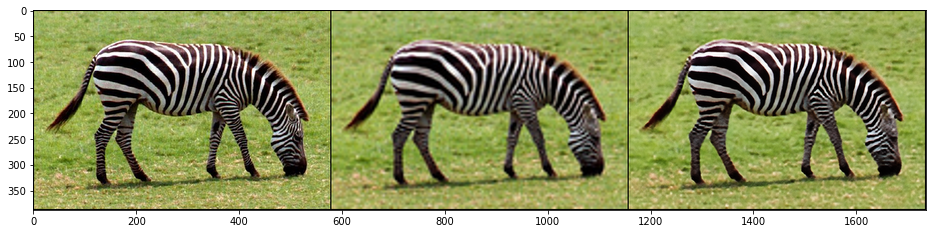

Iteration 01901    PSNR_LR 32.987   PSNR_HR 24.011Iteration 01902    PSNR_LR 33.076   PSNR_HR 24.023Iteration 01903    PSNR_LR 33.229   PSNR_HR 24.035Iteration 01904    PSNR_LR 32.979   PSNR_HR 23.993Iteration 01905    PSNR_LR 33.013   PSNR_HR 24.063Iteration 01906    PSNR_LR 33.170   PSNR_HR 24.055Iteration 01907    PSNR_LR 33.287   PSNR_HR 24.111Iteration 01908    PSNR_LR 33.160   PSNR_HR 24.032Iteration 01909    PSNR_LR 32.873   PSNR_HR 23.976Iteration 01910    PSNR_LR 32.987   PSNR_HR 23.961Iteration 01911    PSNR_LR 33.203   PSNR_HR 24.112Iteration 01912    PSNR_LR 33.086   PSNR_HR 24.058Iteration 01913    PSNR_LR 33.139   PSNR_HR 24.059Iteration 01914    PSNR_LR 32.950   PSNR_HR 24.050Iteration 01915    PSNR_LR 32.901   PSNR_HR 23.995Iteration 01916    PSNR_LR 33.335   PSNR_HR 24.059Iteration 01917    PSNR_LR 33.038   PSNR_HR 24.106Iteration 01918    PSNR_LR 32.988   PSNR_HR 24.023Iteration 01919    PSNR_LR 32.790   PSNR_HR 24.020Iteration 01920    PSNR_LR 32.937   PSNR_HR 24.061

In [8]:
psnr_history = [] 
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

i = 0
p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2973: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


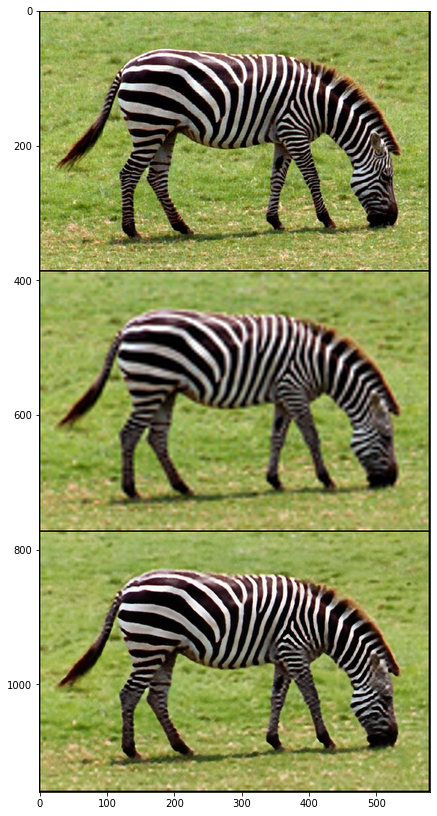

In [10]:
out_HR_np = np.clip(torch_to_np(net(net_input)), 0, 1)
result_deep_prior = put_in_center(out_HR_np, imgs['orig_np'].shape[1:])

# For the paper we acually took `_bicubic.png` files from LapSRN viewer and used `result_deep_prior` as our result
plot_image_grid([imgs['HR_np'],
                 imgs['bicubic_np'],
                 out_HR_np], factor=4, nrow=1);